## Progetto Process Monitoring

Dataset: https://www.kaggle.com/datasets/vinayak123tyagi/bearing-dataset

Piattaforma: https://github.com/amazon-science/chronos-forecasting

#### Librerie da importare

In [1]:
import pandas as pd
from chronos import ChronosPipeline
import matplotlib.pyplot as plt
import os
import torch
import numpy as np
import math
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

/home/programmazione-time/miniconda3/envs/test/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### PIPELINE Chronos

In [2]:
# Lista delle pipeline

# Tiny
pipeline_tiny = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-tiny",
    device_map="cpu",
    torch_dtype=torch.bfloat16,
)

# Mini
pipeline_mini = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-mini",
    device_map="cpu",
    torch_dtype=torch.bfloat16,
)

# Small
pipeline_small = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-small",
    device_map="cpu",
    torch_dtype=torch.bfloat16,
)

# Base
pipeline_base = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-base",
    device_map="cpu",
    torch_dtype=torch.bfloat16,
)

# Large
pipeline_large = ChronosPipeline.from_pretrained(
    "amazon/chronos-t5-large",
    device_map="cpu",
    torch_dtype=torch.bfloat16,
)

#### Processamento dati

In [24]:
path1 = "archive/1st_test/1st_test"         # Path set 1
path2 = "archive/2nd_test/2nd_test"         # Path set 2
path3 = "archive/3rd_test/4th_test/txt"     # Path set 3

nrow = 20480            # Numero di righe da caricare per ogni file
nfile1 = 2156           # Numero di file da caricare per il set 1
nfile2 = 980            # Numero di file da caricare per il set 2
nfile3 = 6300           # Numero di file da caricare per il set 3
n_test = 64             # Numero di righe da usare per il test

# Funzione per caricare e normalizzare i dati
def load_and_normalize_data(path, num_rows, num_files):
    file_list = sorted(os.listdir(path))[:num_files]  # Carica solo i primi num_files file
    data = []
    for file_name in file_list:
        file_path = os.path.join(path, file_name)
        # Specifica il delimitatore come tabulazione
        df = pd.read_csv(file_path, header=None, delimiter="\t", nrows=num_rows)
        # Converti i dati in float
        data.append(df.astype(float).values)
    # Concatena i dati lungo l'asse 0
    data = np.vstack(data)
    
    # Normalizza i dati
    scaler = MinMaxScaler()
    data_normalized = scaler.fit_transform(data)
    
    return data_normalized

# Carica e normalizza i file dal set 1
data1 = load_and_normalize_data(path1, num_rows=nrow, num_files=nfile1)
# Separa i dati in training e test
train_data_set1 = data1[:-n_test]
test_data_set1 = data1[-n_test:]

# Carica e normalizza i file dal set 2
data2 = load_and_normalize_data(path2, num_rows=nrow, num_files=nfile2)
# Separa i dati in training e test
train_data_set2 = data2[:-n_test]
test_data_set2 = data2[-n_test:]

# Carica e normalizza i file dal set 3
data3 = load_and_normalize_data(path3, num_rows=nrow, num_files=nfile3)
# Separa i dati in training e test
train_data_set3 = data3[:-n_test]
test_data_set3 = data3[-n_test:]

## USO LE PIPELINE SUL SET 1

#### PIPELINE TINY

Mean Absolute Error (MAE) per feature: [0.0602233  0.03161341 0.08575854 0.08436699 0.02940325 0.04679865
 0.01706056 0.01561928]
Mean Squared Error (MSE) per feature: [0.00525043 0.00169767 0.01127505 0.01239018 0.00177618 0.00379409
 0.00053272 0.00039487]


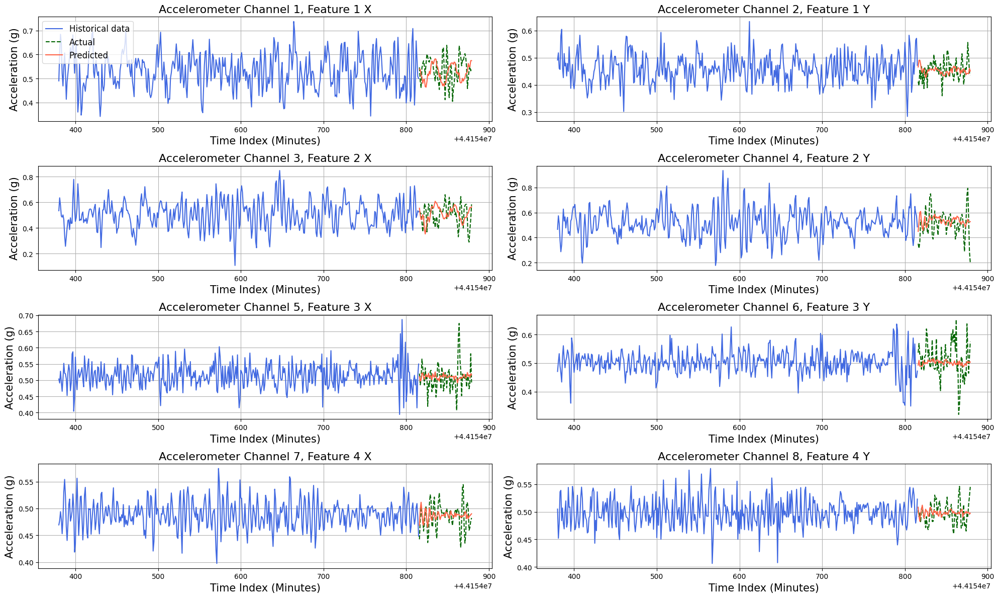

In [4]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set1).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_tiny.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set1
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 12))
total_data_length = len(train_data_set1) + len(test_data_set1)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4",
    "Accelerometer Channel 5",
    "Accelerometer Channel 6",
    "Accelerometer Channel 7",
    "Accelerometer Channel 8"
]
    
for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1] // 2, 2, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set1))
    limited_test_indices = np.arange(len(train_data_set1), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set1[start_idx - len(train_data_set1):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}, Feature {i // 2 + 1} {'X' if i % 2 == 0 else 'Y'}", fontsize=16)
    
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE MINI

Mean Absolute Error (MAE) per feature: [0.04608933 0.0282109  0.08084117 0.08438993 0.02986324 0.04844833
 0.0190556  0.01603483]
Mean Squared Error (MSE) per feature: [0.00376834 0.00140151 0.00981088 0.01209568 0.00178272 0.00391962
 0.00063596 0.00039061]


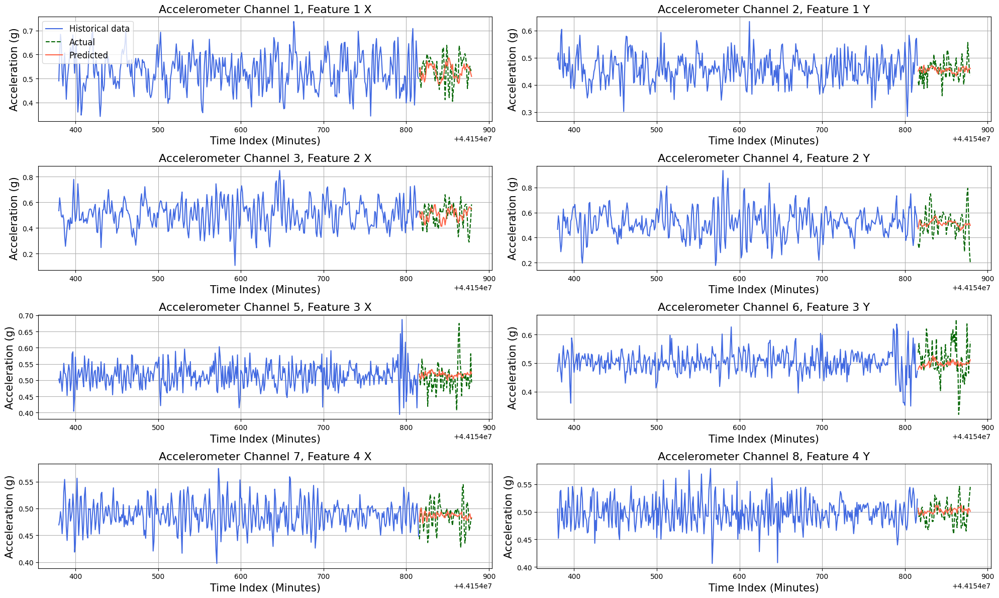

In [5]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set1).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_mini.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set1
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 12))
total_data_length = len(train_data_set1) + len(test_data_set1)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4",
    "Accelerometer Channel 5",
    "Accelerometer Channel 6",
    "Accelerometer Channel 7",
    "Accelerometer Channel 8"
]
    
for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1] // 2, 2, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set1))
    limited_test_indices = np.arange(len(train_data_set1), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set1[start_idx - len(train_data_set1):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}, Feature {i // 2 + 1} {'X' if i % 2 == 0 else 'Y'}", fontsize=16)
    
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE SMALL

Mean Absolute Error (MAE) per feature: [0.04898264 0.02789198 0.073522   0.08782248 0.02791812 0.04793774
 0.01733781 0.01600103]
Mean Squared Error (MSE) per feature: [0.00426463 0.00130756 0.00827586 0.013242   0.00170662 0.00401773
 0.00051172 0.00040807]


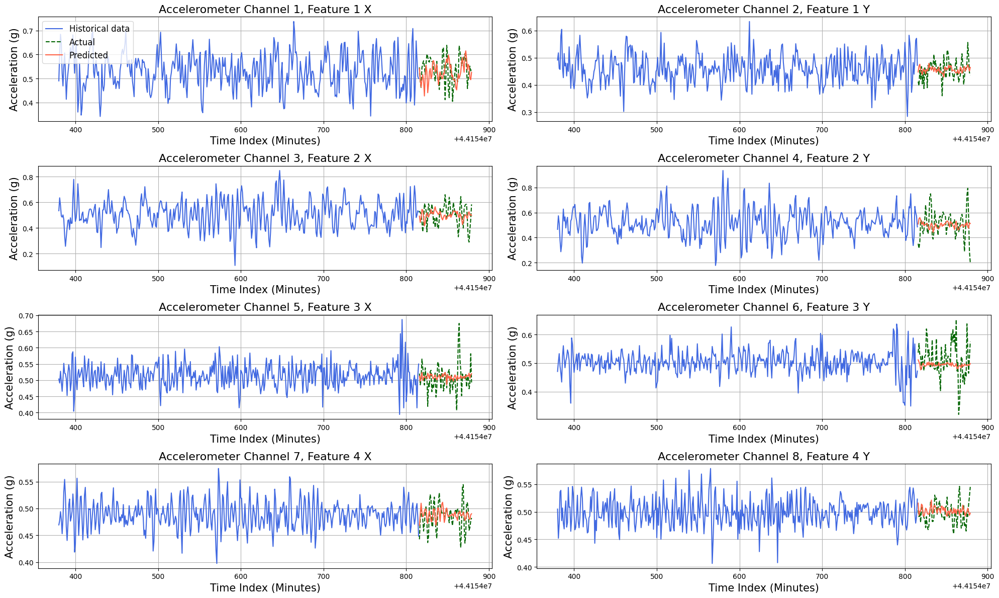

In [6]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set1).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_small.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set1
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 12))
total_data_length = len(train_data_set1) + len(test_data_set1)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4",
    "Accelerometer Channel 5",
    "Accelerometer Channel 6",
    "Accelerometer Channel 7",
    "Accelerometer Channel 8"
]
    
for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1] // 2, 2, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set1))
    limited_test_indices = np.arange(len(train_data_set1), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set1[start_idx - len(train_data_set1):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}, Feature {i // 2 + 1} {'X' if i % 2 == 0 else 'Y'}", fontsize=16)
    
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE BASE

Mean Absolute Error (MAE) per feature: [0.04830182 0.02987732 0.09279678 0.08366543 0.03319052 0.04671462
 0.01738554 0.01590455]
Mean Squared Error (MSE) per feature: [0.0032422  0.00146098 0.01272252 0.01219515 0.00199449 0.00393237
 0.00052083 0.00038405]


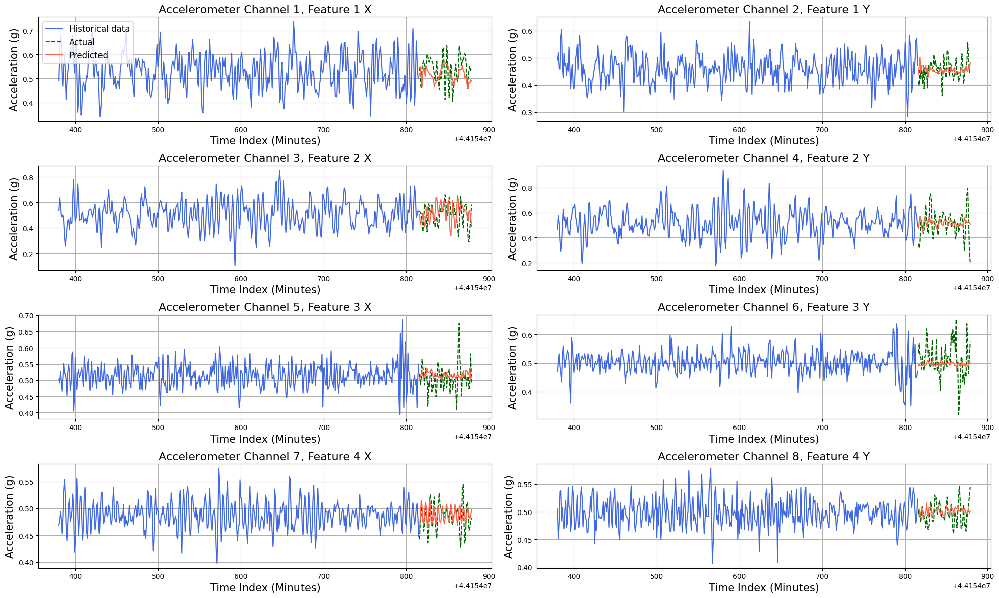

In [7]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set1).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_base.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set1
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 12))
total_data_length = len(train_data_set1) + len(test_data_set1)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4",
    "Accelerometer Channel 5",
    "Accelerometer Channel 6",
    "Accelerometer Channel 7",
    "Accelerometer Channel 8"
]
    
for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1] // 2, 2, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set1))
    limited_test_indices = np.arange(len(train_data_set1), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set1[start_idx - len(train_data_set1):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}, Feature {i // 2 + 1} {'X' if i % 2 == 0 else 'Y'}", fontsize=16)
    
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE LARGE

Mean Absolute Error (MAE) per feature: [0.04887157 0.02936176 0.06314054 0.08064187 0.03025067 0.04841961
 0.01867765 0.01454243]
Mean Squared Error (MSE) per feature: [0.00357829 0.00136149 0.00654829 0.0111018  0.00178512 0.00416768
 0.00059763 0.00032991]


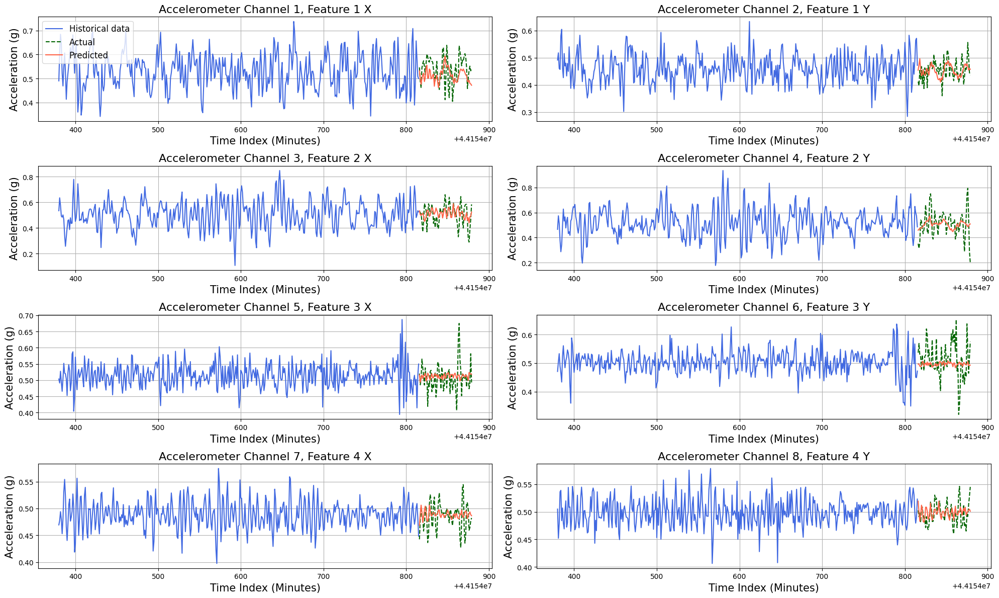

In [8]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set1).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_large.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set1
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 12))
total_data_length = len(train_data_set1) + len(test_data_set1)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4",
    "Accelerometer Channel 5",
    "Accelerometer Channel 6",
    "Accelerometer Channel 7",
    "Accelerometer Channel 8"
]
    
for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1] // 2, 2, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set1))
    limited_test_indices = np.arange(len(train_data_set1), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set1[start_idx - len(train_data_set1):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}, Feature {i // 2 + 1} {'X' if i % 2 == 0 else 'Y'}", fontsize=16)
    
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

## USO LE PIPELINE SUL SET 2

#### PIPELINE TINY

Mean Absolute Error (MAE) per feature: [0.03328371 0.08236713 0.05063761 0.1009279 ]
Mean Squared Error (MSE) per feature: [0.00169892 0.01037893 0.00448507 0.01622317]


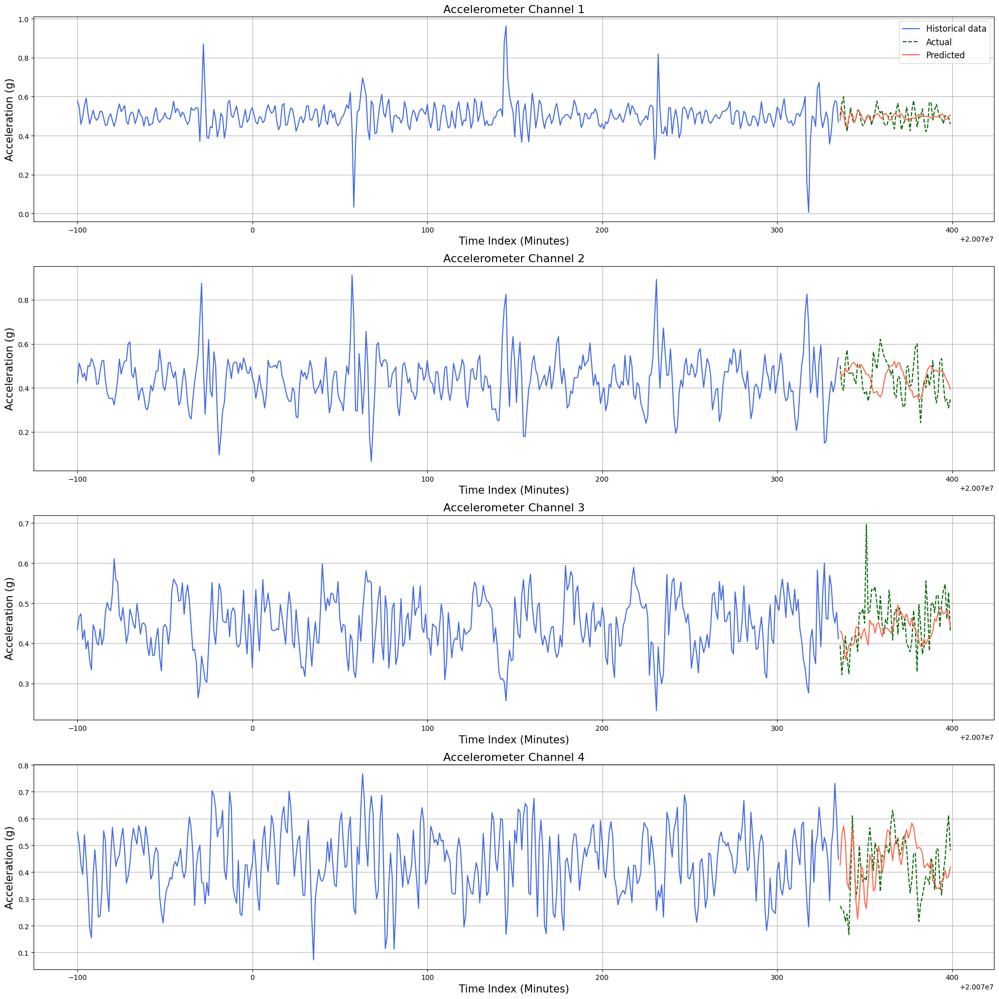

In [14]:

# Prepara i dati per il forecasting
context = torch.tensor(train_data_set2).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_tiny.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set2
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set2) + len(test_data_set2)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set2))
    limited_test_indices = np.arange(len(train_data_set2), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set2[start_idx - len(train_data_set2):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE MINI

Mean Absolute Error (MAE) per feature: [0.03070118 0.06524696 0.06173992 0.07096301]
Mean Squared Error (MSE) per feature: [0.00144321 0.00647521 0.00551633 0.00834098]


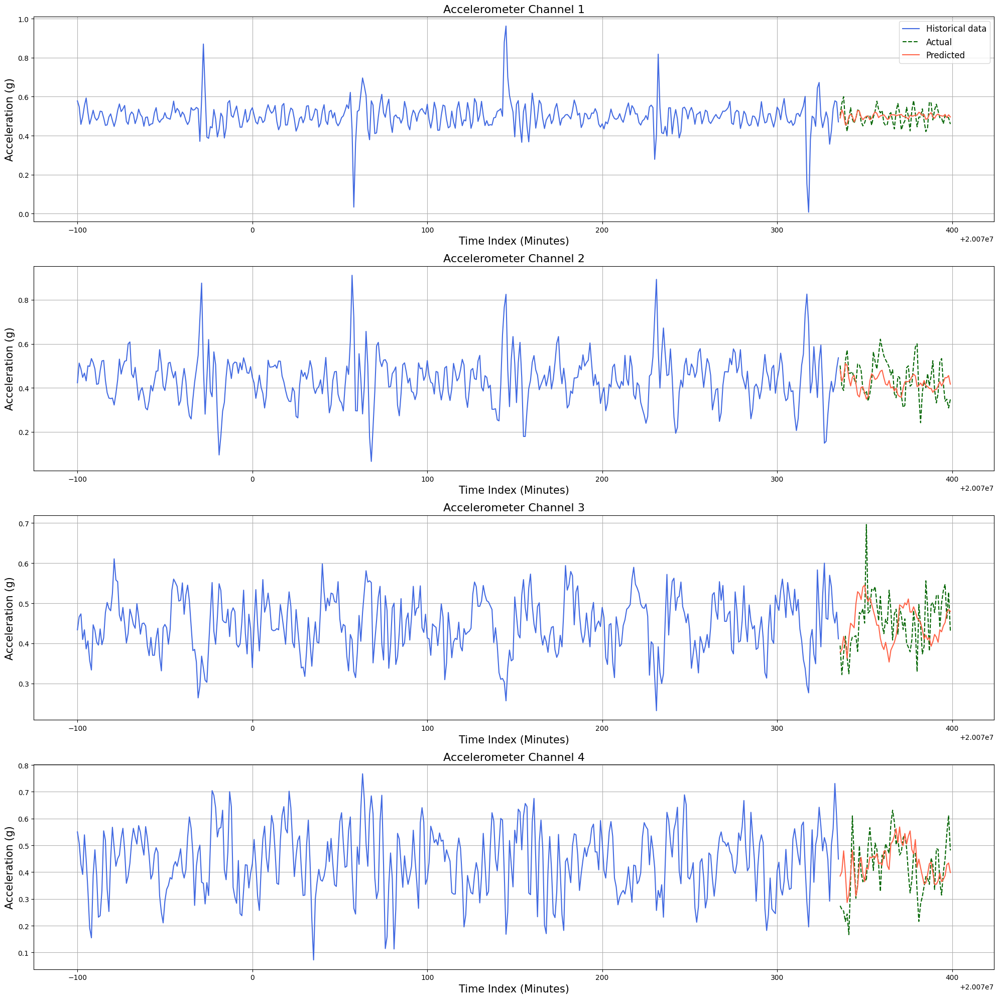

In [15]:

# Prepara i dati per il forecasting
context = torch.tensor(train_data_set2).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_mini.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set2
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set2) + len(test_data_set2)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set2))
    limited_test_indices = np.arange(len(train_data_set2), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set2[start_idx - len(train_data_set2):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE SMALL

Mean Absolute Error (MAE) per feature: [0.02833078 0.06647908 0.04135497 0.06776685]
Mean Squared Error (MSE) per feature: [0.00129355 0.00714921 0.00317378 0.00778741]


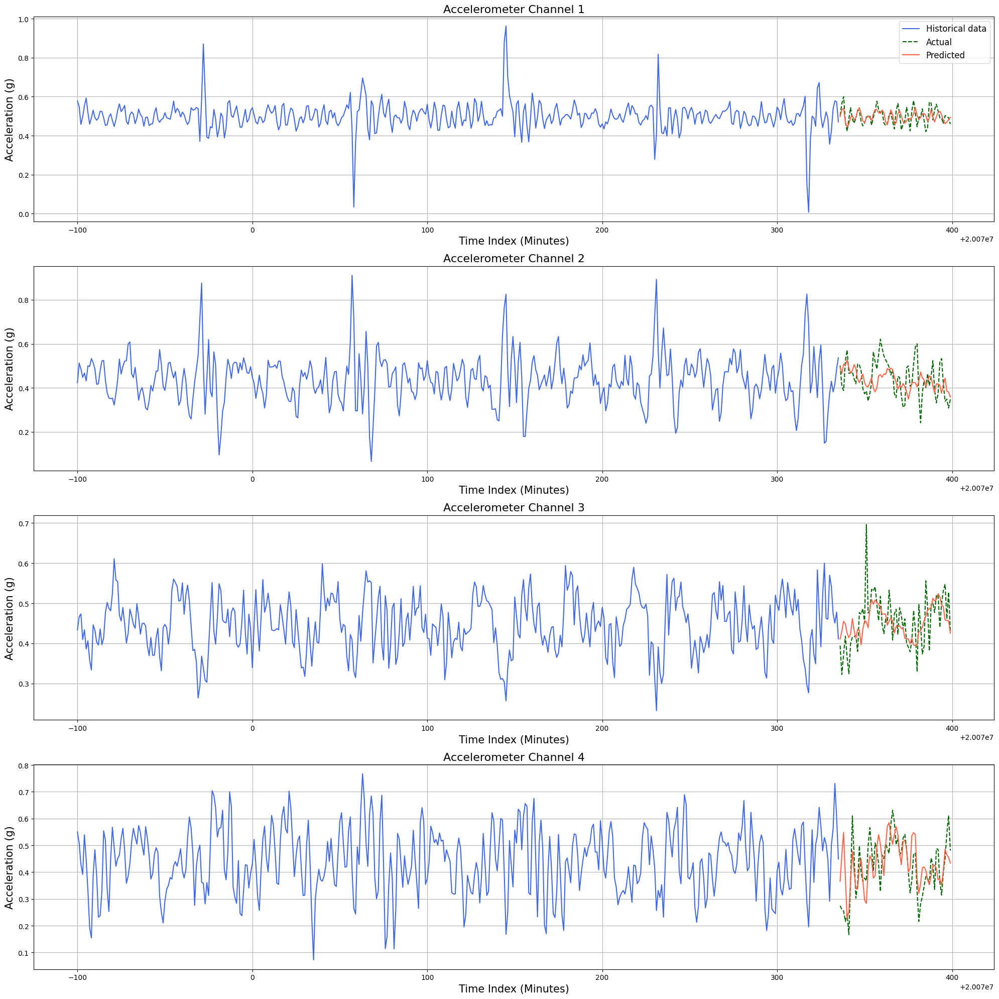

In [16]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set2).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_small.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set2
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set2) + len(test_data_set2)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set2))
    limited_test_indices = np.arange(len(train_data_set2), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set2[start_idx - len(train_data_set2):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE BASE

Mean Absolute Error (MAE) per feature: [0.02033878 0.06406377 0.05212886 0.06211652]
Mean Squared Error (MSE) per feature: [0.00058261 0.00669194 0.00476694 0.00603279]


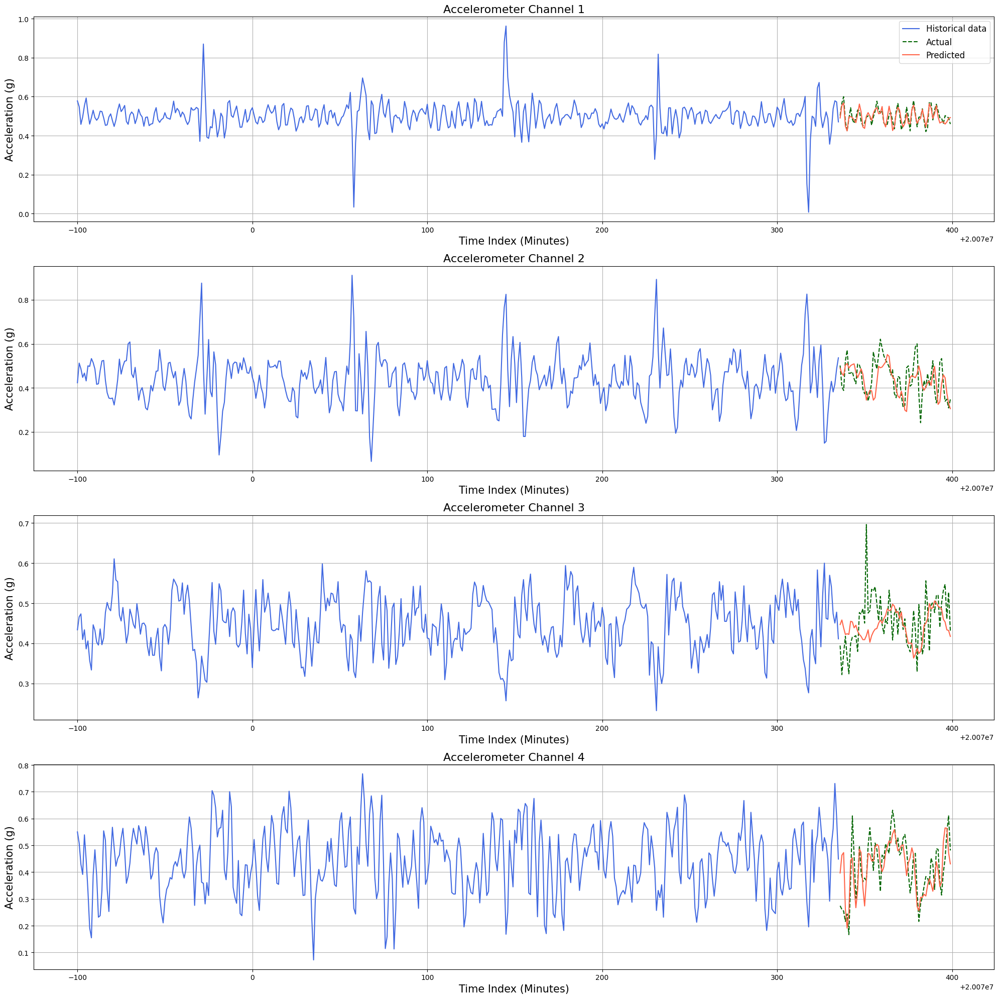

In [17]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set2).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_base.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set2
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set2) + len(test_data_set2)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set2))
    limited_test_indices = np.arange(len(train_data_set2), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set2[start_idx - len(train_data_set2):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE LARGE

Mean Absolute Error (MAE) per feature: [0.02229181 0.04667452 0.04531474 0.07192196]
Mean Squared Error (MSE) per feature: [0.00073418 0.0037973  0.00372066 0.00825849]


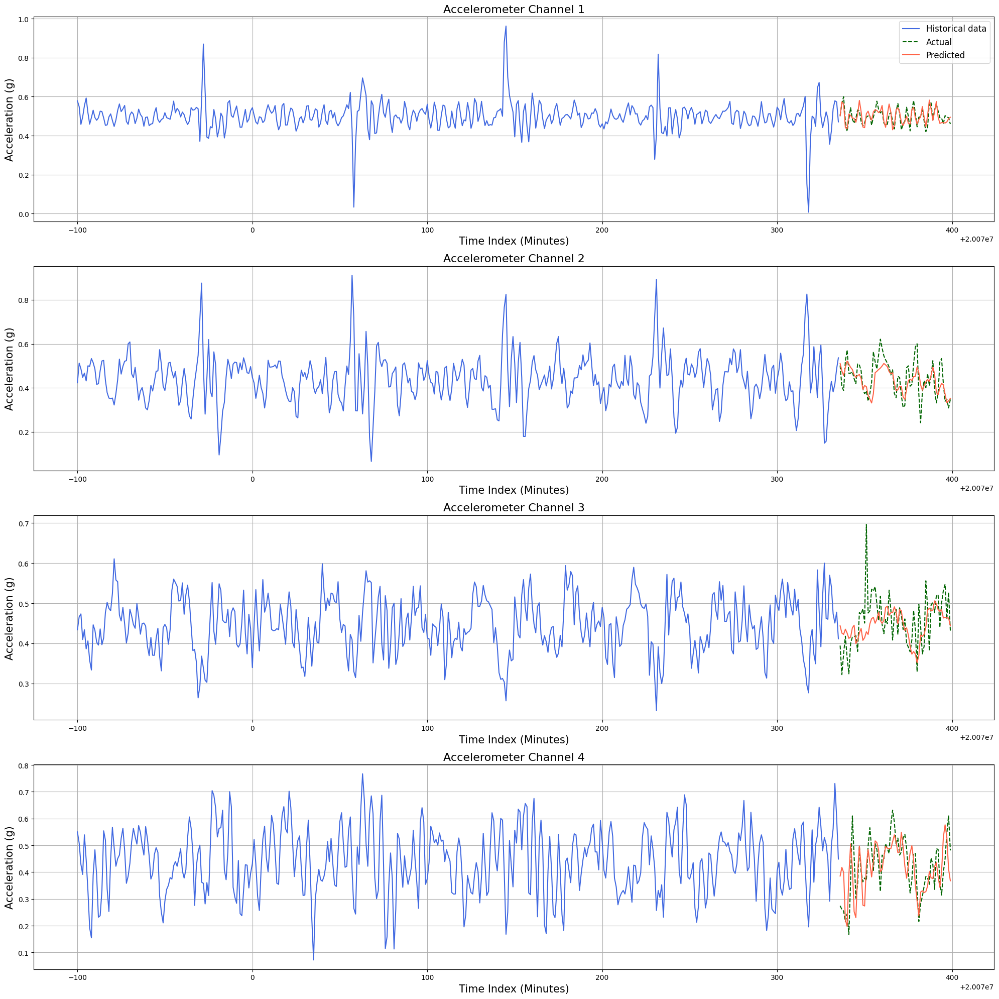

In [18]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set2).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_large.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set2
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set2) + len(test_data_set2)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set2))
    limited_test_indices = np.arange(len(train_data_set2), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set2[start_idx - len(train_data_set2):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

## USO LE PIPELINE SUL SET 3

#### PIPELINE TINY

Mean Absolute Error (MAE) per feature: [0.05241443 0.08145081 0.07623165 0.07069   ]
Mean Squared Error (MSE) per feature: [0.00482964 0.0109497  0.00908082 0.00737347]


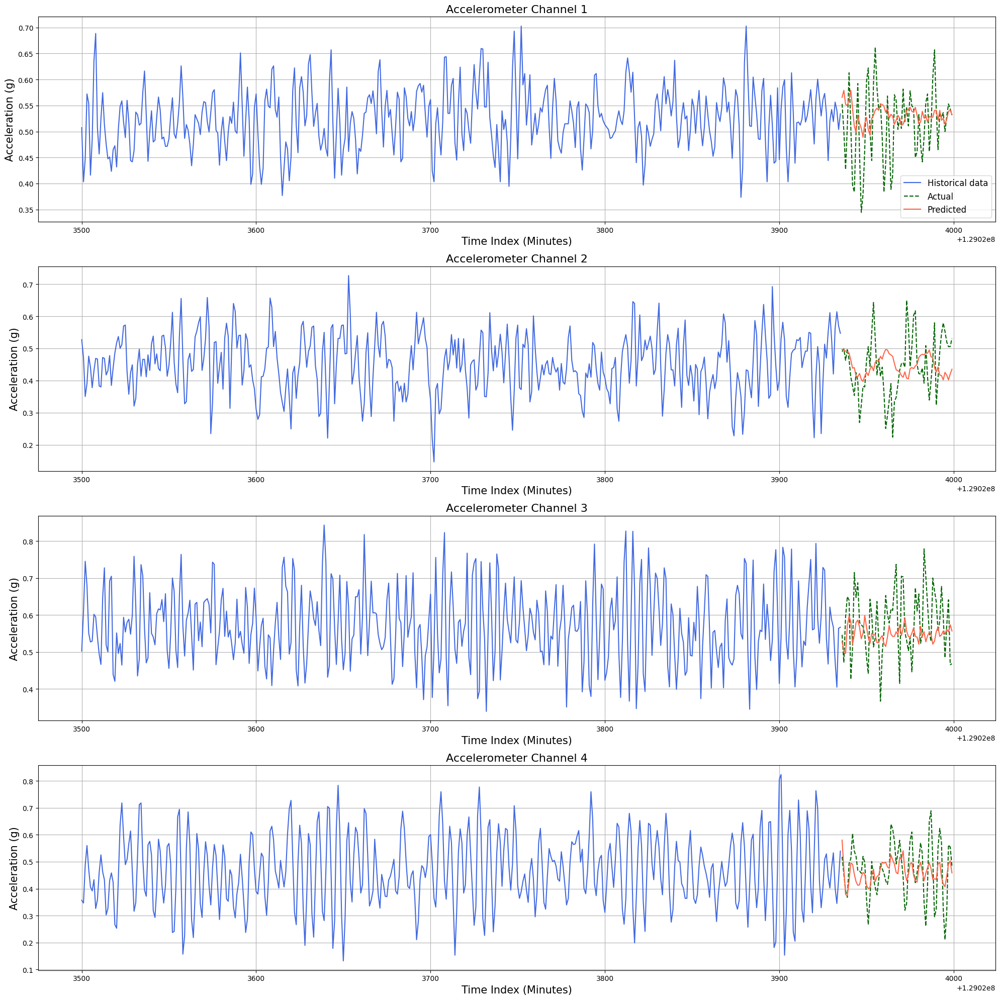

In [25]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set3).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_tiny.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set3
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set3) + len(test_data_set3)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set3))
    limited_test_indices = np.arange(len(train_data_set3), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set3[start_idx - len(train_data_set3):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE MINI

Mean Absolute Error (MAE) per feature: [0.05731518 0.07857613 0.07411041 0.106633  ]
Mean Squared Error (MSE) per feature: [0.00534587 0.00985849 0.0083843  0.01750957]


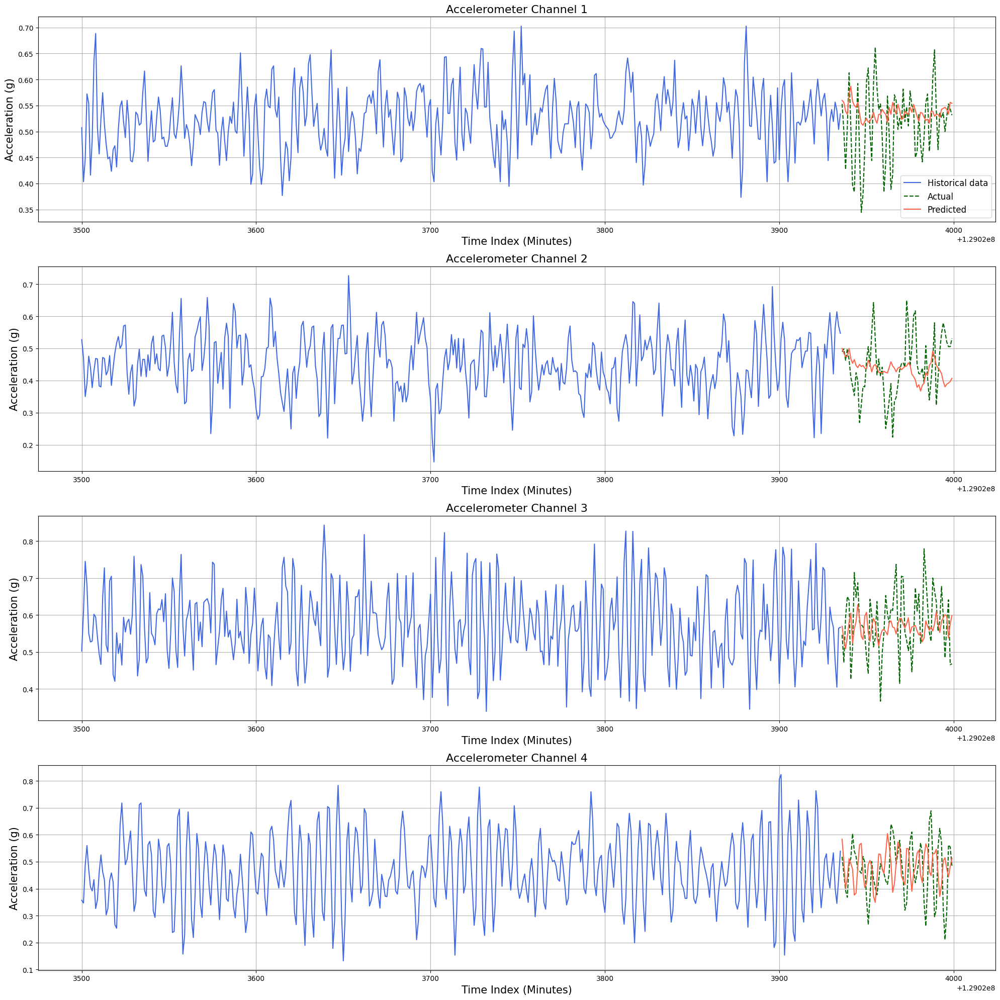

In [26]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set3).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_mini.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set3
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set3) + len(test_data_set3)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set3))
    limited_test_indices = np.arange(len(train_data_set3), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set3[start_idx - len(train_data_set3):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE SMALL

Mean Absolute Error (MAE) per feature: [0.05425823 0.04877635 0.07085278 0.08331155]
Mean Squared Error (MSE) per feature: [0.00509407 0.00395796 0.00787196 0.01034894]


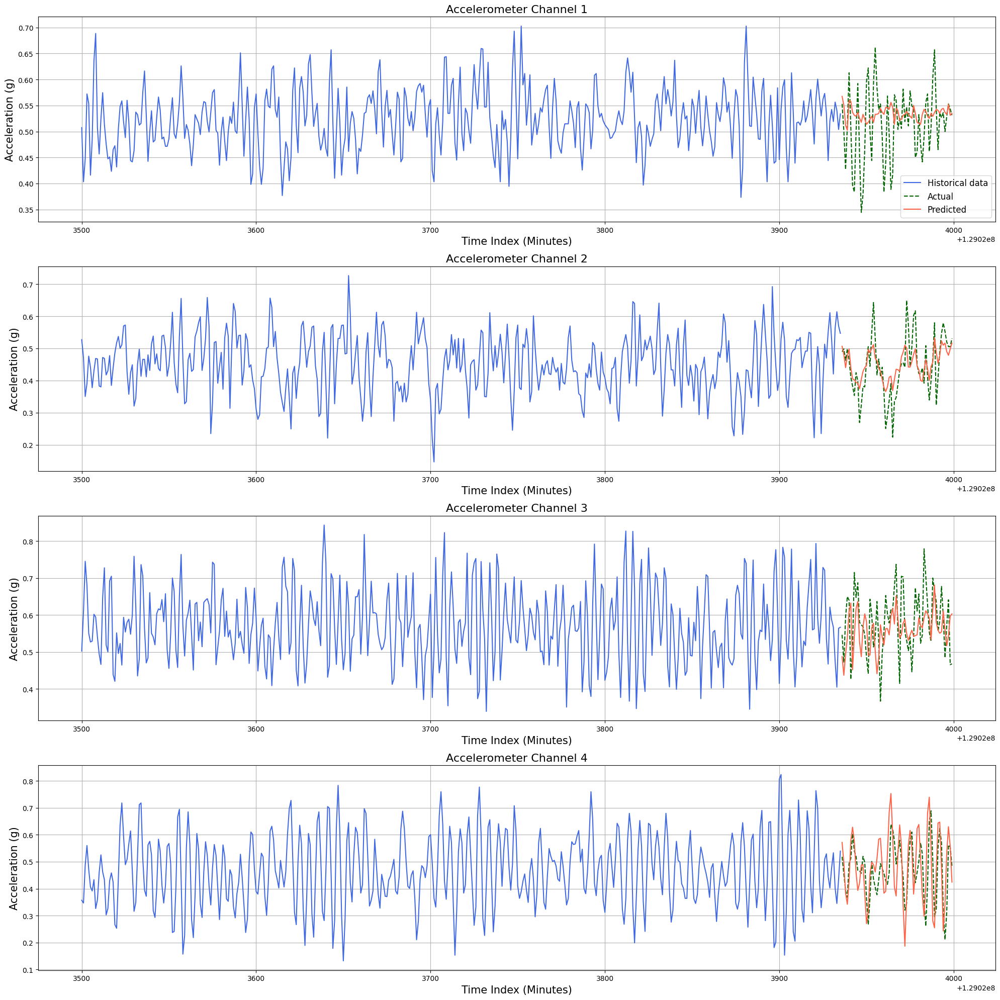

In [27]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set3).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_small.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set3
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set3) + len(test_data_set3)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set3))
    limited_test_indices = np.arange(len(train_data_set3), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set3[start_idx - len(train_data_set3):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE BASE

Mean Absolute Error (MAE) per feature: [0.05012466 0.04553866 0.06775896 0.06113255]
Mean Squared Error (MSE) per feature: [0.00438763 0.00354796 0.00751242 0.00579667]


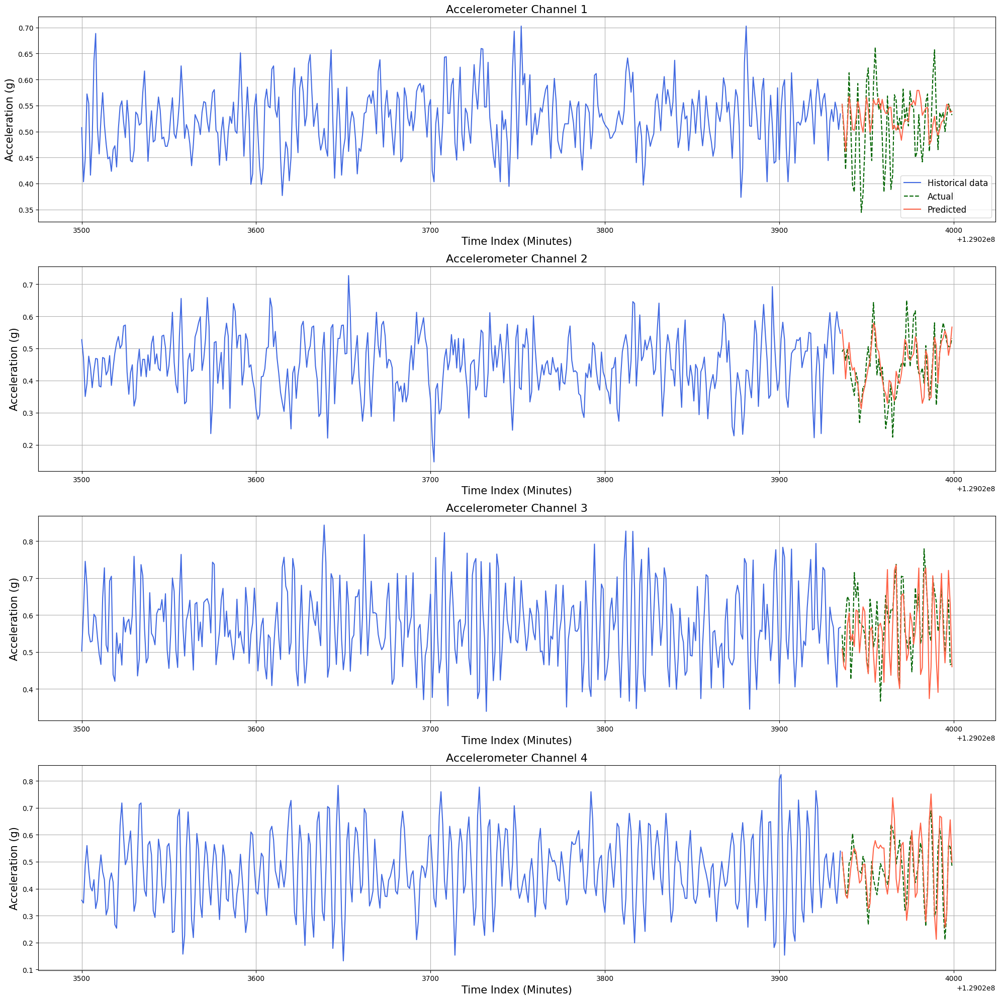

In [28]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set3).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_base.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set3
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set3) + len(test_data_set3)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set3))
    limited_test_indices = np.arange(len(train_data_set3), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set3[start_idx - len(train_data_set3):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()

#### PIPELINE LARGE

Mean Absolute Error (MAE) per feature: [0.05228615 0.04864242 0.05921053 0.08664451]
Mean Squared Error (MSE) per feature: [0.00437169 0.00429139 0.0066176  0.01160438]


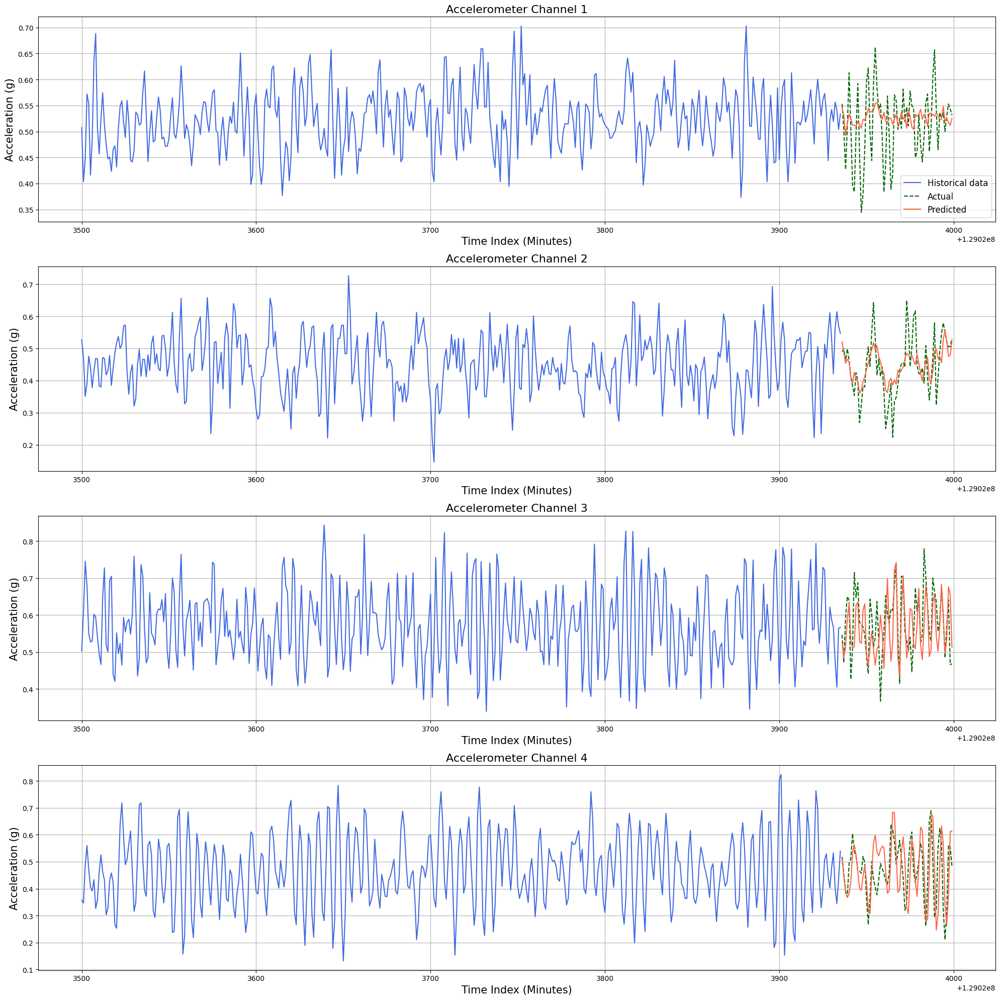

In [29]:
# Prepara i dati per il forecasting
context = torch.tensor(train_data_set3).float().T
    
# Esegui il forecasting per ogni colonna
forecast_segment = pipeline_large.predict(
    context=context,
    prediction_length=n_test,                 # Lunghezza della previsione
    num_samples=40                            # Numero di campioni per la previsione
)
forecasts = forecast_segment.numpy()
        
# Calcola l'errore medio di previsione per ogni feature
predicted = np.median(forecasts, axis=1).T
actual = test_data_set3
    
# Mean Absolute Error
mae = np.mean(np.abs(predicted - actual), axis=0)
print(f"Mean Absolute Error (MAE) per feature: {mae}")
# Mean Squared Error
mse = np.mean((predicted - actual) ** 2, axis=0)
print(f"Mean Squared Error (MSE) per feature: {mse}")
  
    
# Grafica dei risultati per ogni feature
plt.figure(figsize=(20, 20))
total_data_length = len(train_data_set3) + len(test_data_set3)
start_idx = max(0, total_data_length - 500)

# Etichette specifiche per ciascun canale
channel_labels = [
    "Accelerometer Channel 1",
    "Accelerometer Channel 2",
    "Accelerometer Channel 3",
    "Accelerometer Channel 4"
]

for i in range(actual.shape[1]):
    plt.subplot(actual.shape[1], 1, i + 1)
        
    # Indici limitati per la visualizzazione
    limited_train_indices = np.arange(start_idx, len(train_data_set3))
    limited_test_indices = np.arange(len(train_data_set3), total_data_length)
    
    # Plot dei dati storici (solo gli ultimi punti)
    plt.plot(limited_train_indices, train_data_set3[start_idx - len(train_data_set3):, i], color="royalblue", label="Historical data")
        
    # Plot dei dati effettivi e previsti (test)
    plt.plot(limited_test_indices, actual[:, i], color="darkgreen", linestyle='--', label="Actual")
    plt.plot(limited_test_indices, predicted[:, i], color="tomato", label="Predicted")
    
    # Imposta il titolo e leggenda
    plt.title(f"{channel_labels[i]}", fontsize=16)
        
    # Aggiungi etichette agli assi
    plt.xlabel('Time Index (Minutes)', fontsize=15)             # Rappresenta gli indici temporali dei dati
    plt.ylabel('Acceleration (g)', fontsize=15)                 # Rappresenta i valori delle features
    
    if i == 0:
        plt.legend(fontsize=12)
    plt.grid()
    
plt.tight_layout()
plt.show()